In [1]:
from reprophylo import *

Before starting anything downstream, ensure you have done the following:

1. Make a folder for the order you are processing
2. Within this folder, create 3 others: 1-fetch_clean_align, 2-SATIVA, 3-Post_SATIVA
3. Download the species list for the order you will process and make sure it is in the directory 1-fetch_clean_align
4. Make sure this notebook is in the directory 1-fetch_clean_align


# Fetch from GenBank

Download all available 12S sequences for a list of taxa from the target species list from Genbank.

## Convert species list to genus list

The list of species names for these orders was prepared in a simple text file: reference_species_list.txt

In [2]:
!head reference_species_list.txt

Abramis brama
Acipenser sturio
Alburnoides bipunctatus
Alburnus alburnus
Alosa alosa
Alosa fallax
Ambloplites rupestris
Ameiurus melas
Ameiurus nebulosus
Anguilla anguilla


Now, fetch records from genbank using list of species names.

In [3]:
!fetch_from_db.py -h

usage: fetch_from_db.py [-h] [-t <FILE>] [-a <FILE>] [-m <string>]
                        [--no-download] [-o <string>] [-@ <email-address>]
                        [-v] [--version]

Search/Fetch all available DNA sequences for a list of taxa/accessions and a
given marker gene from Genbank

optional arguments:
  -h, --help            show this help message and exit
  -t <FILE>, --taxlist <FILE>
                        text file containing list of taxa to search for on
                        Genbank
  -a <FILE>, --accessionlist <FILE>
                        text file containing list of accessions to fetch from
                        Genbank
  -m <string>, --marker <string>
                        name of gene to be searched for (put in "" if the
                        search term consists of more than one word
  --no-download         search Genbank and just return the number of records
                        found for list of taxa
  -o <string>, --out <string>
                    

In [4]:
!fetch_from_db.py \
-t reference_species_list.txt \
-m 12S \
-o fish_12S_Genbank_raw \
-@ haikuilee@gmail.com > fetch_fish_log.txt

In [5]:
!cat fetch_fish_log.txt


metaBEAT may be querying NCBI's Entrez databases to fetch/verify taxonomic ids. Entrez User requirements state that you need to identify yourself by providing an email address so that NCBI can contact you in case there is a problem.

You have specified: 'haikuilee@gmail.com'


QUERYING GENBANK

check for synonyms for "12S" (this is relevant only for Genbank searches)

fetching accessions ..

#	Abramis brama	3
#	Acipenser sturio	10
#	Alburnoides bipunctatus	1
#	Alburnus alburnus	3
#	Alosa alosa	2
#	Alosa fallax	3
#	Ambloplites rupestris	3
#	Ameiurus melas	5
#	Ameiurus nebulosus	5
#	Anguilla anguilla	59
#	Aspius aspius	0
#	Barbatula barbatula	2
#	Barbus barbus	3
#	Blicca bjoerkna	4
#	Carassius auratus	95
#	Carassius carassius	3
#	Chondrostoma nasus	2
#	Cobitis taenia	4
#	Coregonus albula	0
#	Coregonus autumnalis	2
#	Coregonus lavaretus	80
#	Coregonus oxyrinchus	22
#	Cottus gobio	1
#	Ctenopharyngodon idella	9
#	Cyprinus carpio	47
#	Esox lucius	12
#	Gasterosteus aculeatus	13
#	Gobio gobio

In [6]:
!ls

12S_r_RNA.fasta		      fish_species_vs_locus_raw.csv
fetch_clean_align_tree.ipynb  fish_target_locus.csv
fetch_fish_log.txt	      Project
fish_12S_add_denovo.gb	      reference_species_list.txt
fish_12S_Genbank_raw.gb       Species_list
fish_loci_counts.txt	      species_list_before.txt
fish_loci.csv


Read reference sequences into ReproPhylo and filter to keep only proper 12S records.

In [7]:
!cat fish_12S_Genbank_raw.gb ../0-Convert_denovo_fasta_to_gb/INBO_and_EVO_denovo_12S.gb > fish_12S_add_denovo.gb

In [8]:
list_loci_in_genbank('fish_12S_add_denovo.gb', # The input genbank file
                     'fish_loci.csv',               # The loci file
                     'fish_loci_counts.txt')

In [9]:
!cat fish_loci_counts.txt


There are 113 gene names (or gene product names) detected
----------------------------------
Gene and count sorted by gene name
----------------------------------
1 instances of CDS,ATP synthase F0 subunit 6
1 instances of CDS,ATP synthase F0 subunit 8
361 instances of CDS,ATP6
363 instances of CDS,ATP8
25 instances of CDS,ATPase 6
25 instances of CDS,ATPase 8
8 instances of CDS,ATPase6
2 instances of CDS,atpase6
8 instances of CDS,ATPase8
2 instances of CDS,atpase8
8 instances of CDS,Cb
25 instances of CDS,CO1
25 instances of CDS,CO2
25 instances of CDS,CO3
1 instances of CDS,cob
1 instances of CDS,coi
52 instances of CDS,COI
45 instances of CDS,COII
2 instances of CDS,coii
43 instances of CDS,COIII
2 instances of CDS,coiii
1 instances of CDS,CoIII
2 instances of CDS,cox1
313 instances of CDS,COX1
313 instances of CDS,COX2
2 instances of CDS,cox2
2 instances of CDS,cox3
312 instances of CDS,COX3
3 instances of CDS,COXI
6 instances of CDS,CoxI
3 instances of CDS,COXII
6 instances of C

In [10]:
!cat fish_loci.csv

dna,rRNA,12S_r_RNA,12S r RNA
dna,rRNA,12S_small_subunit_ribosomal_RNA,12S small subunit ribosomal RNA
dna,rRNA,12_S_rRNA,12 S rRNA
dna,CDS,ATP_synthase_F0_subunit_6,ATP synthase F0 subunit 6
dna,CDS,ATP_synthase_F0_subunit_8,ATP synthase F0 subunit 8
dna,CDS,ATPase_6,ATPase 6
dna,CDS,ATPase_8,ATPase 8
dna,CDS,CO1,CO1
dna,CDS,CO2,CO2
dna,CDS,CO3,CO3
dna,CDS,COXI,COXI
dna,CDS,COXII,COXII
dna,CDS,COXIII,COXIII
dna,CDS,Cb,Cb
dna,CDS,CoIII,CoIII
dna,CDS,CoxI,CoxI
dna,CDS,CoxII,CoxII
dna,CDS,CoxIII,CoxIII
dna,CDS,Cyt_B,Cyt B
dna,CDS,Cyt_b,Cyt b
dna,CDS,LOC100380705,LOC100380705
dna,CDS,LOC106577883,LOC106577883
dna,CDS,LOC106577884,LOC106577884
dna,CDS,LOC106577886,LOC106577886
dna,CDS,LOC106577888,LOC106577888
dna,CDS,LOC106577890,LOC106577890
dna,CDS,MT-ATP6,ATP6,ATPase6,atpase6
dna,CDS,MT-ATP8,ATP8,ATPase8,atpase8
dna,CDS,MT-CO1,coi,COI,cox1,COX1,cytochrome c oxidase subunit I
dna,CDS,MT-CO2,COII,coii,COX2,cox2,cytochrome c oxidase subunit II
dna,CDS,MT-CO3,COIII,coiii,cox3,COX3,cytochrom

Extract all synonyms for '12S' and write to text file.

In [11]:
%%file fish_target_locus.csv
dna,rRNA,12S_r_RNA,12S r RNA,1
dna,rRNA,12S_small_subunit_ribosomal_RNA,12S small subunit ribosomal RNA,1
dna,rRNA,12_S_rRNA,12 S rRNA,1
dna,rRNA,rrnS,12S ribosomal RNA,12S rRNA,1
dna,rRNA,rrns,rrns,1
dna,rRNA,s-rRNA,s-rRNA,1

Overwriting fish_target_locus.csv


In [12]:
!cat fish_target_locus.csv

dna,rRNA,12S_r_RNA,12S r RNA,1
dna,rRNA,12S_small_subunit_ribosomal_RNA,12S small subunit ribosomal RNA,1
dna,rRNA,12_S_rRNA,12 S rRNA,1
dna,rRNA,rrnS,12S ribosomal RNA,12S rRNA,1
dna,rRNA,rrns,rrns,1
dna,rRNA,s-rRNA,s-rRNA,1

# Reprophylo project

Start ReproPhylo project.

#### delete the project file 'fish_raw.pkl' as below then rerun the code as below if running program more than once.

In [13]:
!mkdir Project

mkdir: cannot create directory ‘Project’: File exists


In [14]:
pj = Project('fish_target_locus.csv', pickle='Project/fish_raw.pkl',git=False)

DEBUG:Cloud:Log file (/root/.picloud/cloud.log) opened


Read 12S sequences into ReproPhylo.

In [15]:
pj.read_embl_genbank(['fish_12S_add_denovo.gb'])

/home/reprophylo/reprophylo.py:1015: UserWarning: Version control off
  warnings.warn('Version control off')


In [16]:
pj.extract_by_locus()

In [17]:
pj.species_vs_loci('fish_species_vs_locus_raw.csv')

In [18]:
!cat fish_species_vs_locus_raw.csv

Write out the 12S sequences to a fasta file which will then be clustered with vsearch to identify redundant sequences. 

__NB.__ Reprophylo has a function to write out CDS's to fasta: `pj.write_by_locus()`, will produce a fasta file for each locus in the project. so in this case the result will be called `12S_r_RNA.fasta`. When dealing with CDS's Reprophylo seems also to automatically reverse complement any sequences in case it's indicated in the Genbank file metadata that the CDS is on the complementary strand, so in the locus object all CDS sequences should be in the same orientation.

In [19]:
pj.write_by_locus()

In [20]:
species=[]
for r in pj.records:
    source = [f for f in r.features if f.type == 'source'][0]
    species.append(" ".join(source.qualifiers['organism'][0].split()[0:2]))
    
#print set(species)
total=len(species)
species=list(set(species))

print "Total number of records: %i" %total
print "Number of species (see below for full list): %i" %len(species)
print species

Total number of records: 971
Number of species (see below for full list): 69
['Salmo salar', 'Rutilus rutilus', 'Lota lota', 'Alosa alosa', 'Alburnus alburnus', 'Barbus barbus', 'Lampetra fluviatilis', 'Thymallus thymallus', 'Esox lucius', 'Abramis brama', 'Leuciscus leuciscus', 'Ctenopharyngodon idella', 'Pomatoschistus minutus', 'Coregonus autumnalis', 'Sander lucioperca', 'Petromyzon marinus', 'Squalius cephalus', 'Ponticola kessleri', 'Pimephales promelas', 'Barbatula barbatula', 'Leucaspius delineatus', 'Coregonus lavaretus', 'Oncorhynchus gorbuscha', 'Oncorhynchus mykiss', 'Lampetra planeri', 'Cyprinus carpio', 'Neogobius fluviatilis', 'Ameiurus melas', 'Salvelinus fontinalis', 'Tinca tinca', 'Chondrostoma nasus', 'Perca fluviatilis', 'Coregonus oxyrinchus', 'Gasterosteus aculeatus', 'Gobio gobio', 'Phoxinus phoxinus', 'Hypophthalmichthys nobilis', 'Platichthys flesus', 'Micropterus salmoides', 'Cottus gobio', 'Carassius auratus', 'Solea solea', 'Acipenser sturio', 'Alburnoides b

Pickle the project.

In [21]:
pickle_pj(pj, 'Project/fish_raw.pkl')

'Project/fish_raw.pkl'

# Vsearch - remove redundancy

Remove redundancy by clustering the 12S sequences with vsearch.

In [22]:
!vsearch -threads 5 --cluster_fast 12S_r_RNA.fasta --strand both --uc 12S_id-1.uc --id 1 --query_cov 1

vsearch v1.1.0_linux_x86_64, 31.3GB RAM, 8 cores
https://github.com/torognes/vsearch

Reading file 12S_r_RNA.fasta 100%
626825 nt in 973 seqs, min 62, max 1214, avg 644
Indexing sequences 100%
Masking 100%
Sorting by length 100%
Counting unique k-mers 100%
Clustering 100%
Writing clusters 100%
Clusters: 368 Size min 1, max 93, avg 2.6
Singletons: 221, 22.7% of seqs, 60.1% of clusters


In [23]:
fish_list = open("species_list_before.txt","w") 
species=[]
for r in pj.records:
    source = [f for f in r.features if f.type == 'source'][0]
    species.append(" ".join(source.qualifiers['organism'][0].split()[0:2]))
    
#print set(species)
total=len(species)
species=list(set(species))

print "Total number of records: %i" %total
print "Number of species (see below for full list): %i" %len(species)
print species

for species_names in species:
  fish_list.write("%s\n" %  species_names)
fish_list.close()

!sort species_list_before.txt > species_list_before_sorted.txt

Total number of records: 971
Number of species (see below for full list): 69
['Salmo salar', 'Rutilus rutilus', 'Lota lota', 'Alosa alosa', 'Alburnus alburnus', 'Barbus barbus', 'Lampetra fluviatilis', 'Thymallus thymallus', 'Esox lucius', 'Abramis brama', 'Leuciscus leuciscus', 'Ctenopharyngodon idella', 'Pomatoschistus minutus', 'Coregonus autumnalis', 'Sander lucioperca', 'Petromyzon marinus', 'Squalius cephalus', 'Ponticola kessleri', 'Pimephales promelas', 'Barbatula barbatula', 'Leucaspius delineatus', 'Coregonus lavaretus', 'Oncorhynchus gorbuscha', 'Oncorhynchus mykiss', 'Lampetra planeri', 'Cyprinus carpio', 'Neogobius fluviatilis', 'Ameiurus melas', 'Salvelinus fontinalis', 'Tinca tinca', 'Chondrostoma nasus', 'Perca fluviatilis', 'Coregonus oxyrinchus', 'Gasterosteus aculeatus', 'Gobio gobio', 'Phoxinus phoxinus', 'Hypophthalmichthys nobilis', 'Platichthys flesus', 'Micropterus salmoides', 'Cottus gobio', 'Carassius auratus', 'Solea solea', 'Acipenser sturio', 'Alburnoides b

Extract ids of representative sequences identified by vsearch -> remove all others from the object.

In [24]:
ids = []

uc=open('12S_id-1.uc', 'r')

for line in uc:
    if line.startswith('C'):
        ids.append("_".join(line.split("\t")[8].split("_")[0:-1])) #record ids in the fasta file had '_f0' attached remove this
        
recs_to_keep = {'12S_r_RNA': []}
recs_to_drop = {'12S_r_RNA': []}

for r in pj.records:
    if r.id in ids:
        recs_to_keep['12S_r_RNA'].append(r.id)
    else:
        recs_to_drop['12S_r_RNA'].append(r.id)
        
print "to drop: %s" %len(recs_to_drop['12S_r_RNA'])
print "to keep: %s" %len(recs_to_keep['12S_r_RNA'])

print "TOTAL: %s" %(len(recs_to_drop['12S_r_RNA']) + len(recs_to_keep['12S_r_RNA']))

to drop: 603
to keep: 368
TOTAL: 971


Exclude redundant records from object.

In [25]:
pj.exclude(start_from_max=False, **recs_to_drop)

In [26]:
fish_list = open("species_list_after.txt","w") 
species=[]
for r in pj.records:
    if r.id in recs_to_keep['12S_r_RNA']:
        source = [f for f in r.features if f.type == 'source'][0]
        species.append(" ".join(source.qualifiers['organism'][0].split()[0:2]))
    
#print set(species)
total=len(species)
species=list(set(species))

print "Total number of records: %i" %total
print "Number of species (see below for full list): %i" %len(species)
print species

for species_names in species:
  fish_list.write("%s\n" %  species_names)
fish_list.close()

!sort species_list_after.txt > species_list_after_sorted.txt

Total number of records: 368
Number of species (see below for full list): 68
['Salmo salar', 'Rutilus rutilus', 'Leuciscus leuciscus', 'Lota lota', 'Alburnus alburnus', 'Thymallus thymallus', 'Lampetra fluviatilis', 'Barbus barbus', 'Esox lucius', 'Alosa alosa', 'Barbatula barbatula', 'Ctenopharyngodon idella', 'Sander lucioperca', 'Coregonus autumnalis', 'Petromyzon marinus', 'Squalius cephalus', 'Ponticola kessleri', 'Pimephales promelas', 'Pomatoschistus minutus', 'Leucaspius delineatus', 'Coregonus lavaretus', 'Oncorhynchus gorbuscha', 'Oncorhynchus mykiss', 'Cyprinus carpio', 'Neogobius fluviatilis', 'Ameiurus melas', 'Salvelinus fontinalis', 'Tinca tinca', 'Chondrostoma nasus', 'Perca fluviatilis', 'Ameiurus nebulosus', 'Gasterosteus aculeatus', 'Phoxinus phoxinus', 'Hypophthalmichthys nobilis', 'Platichthys flesus', 'Micropterus salmoides', 'Cottus gobio', 'Acipenser sturio', 'Solea solea', 'Carassius auratus', 'Alburnoides bipunctatus', 'Rhodeus sericeus', 'Hypophthalmichthys m

In [27]:
!diff -u species_list_before_sorted.txt species_list_after_sorted.txt | sed -n '1,2d;/^[-+]/p'

-Lampetra planeri


In [28]:
!mkdir Species_list

mkdir: cannot create directory ‘Species_list’: File exists


In [29]:
!mv species* ./Species_list/

I have noticed that there are a few records that contain two 12S features, e.g. AH013021.2. 
one featrue is for 5' fragment, one featrue is for 3' fragment" 
Reprophylo will treat this as separate sequences and so this will potentially cause problems. So, I'll screen for records that have more than one feature (should only be in a few cases) and double check in the original Genbank file. 

Seems like they all have the above problem and are all by the same authors. So I'll drop them too, just to make sure, and also remove them from the keep list.

In [30]:
for r in pj.records:

        if len(r.features) > 2:
            
            print "\n### %s has %i features\n" %(r.id, len(r.features))
            rRNA_gene_names = []
            print r.format('genbank')
            for feature in r.features:
#                print feature.type
                if feature.type == 'rRNA':
                    rRNA_gene_names.append(feature.qualifiers['product'][0])
                
            if len(list(set(rRNA_gene_names))) < len(rRNA_gene_names):
                print "Duplicate detected in %s -> add to droplist" %(r.id)
                recs_to_drop['12S_r_RNA'].append(r.id)
                
                for i in reversed(range(len(recs_to_keep['12S_r_RNA']))):
                    if recs_to_keep['12S_r_RNA'][i] == r.id:
                        print "removing from keeplist"
                        del recs_to_keep['12S_r_RNA'][i]


### AH013021.2 has 3 features

LOCUS       AH013021                 649 bp    DNA     linear   VRT 16-AUG-2016
DEFINITION  Micropterus salmoides isolate B2 12S ribosomal RNA genes, partial
            sequence; mitochondrial.
ACCESSION   AH013021
VERSION     AH013021.2
KEYWORDS    .
SOURCE      mitochondrion Micropterus salmoides (largemouth bass)
  ORGANISM  Micropterus salmoides
            Eukaryota; Metazoa; Chordata; Craniata; Vertebrata; Euteleostomi;
            Actinopterygii; Neopterygii; Teleostei; Neoteleostei;
            Acanthomorphata; Eupercaria; Centrarchiformes; Centrarchoidei;
            Centrarchidae; Micropterus.
REFERENCE   1  (bases 1 to 649)
  AUTHORS   Truong,K.T., Burridge,C.P., Austin,C.M. and Jerry,D.R.
  TITLE     Molecular phylogeny of the Australian Percichthyidae (Percoidei:
            Perciformes)
  JOURNAL   Unpublished
REFERENCE   2  (bases 1 to 649)
  AUTHORS   Truong,K.T., Burridge,C.P., Austin,C.M. and Jerry,D.R.
  TITLE     Direct Submission
  

Exclude records with duplicated rRNA ids.

In [31]:
pj.exclude(start_from_max=False, **recs_to_drop)

In [32]:
species=[]
for r in pj.records:
    if r.id in recs_to_keep['12S_r_RNA']:
        source = [f for f in r.features if f.type == 'source'][0]
        species.append(" ".join(source.qualifiers['organism'][0].split()[0:2]))
    
#print set(species)
total=len(species)
species=list(set(species))

print "Total number of records: %i" %total
print "Number of species (see below for full list): %i" %len(species)
print species

Total number of records: 366
Number of species (see below for full list): 68
['Salmo salar', 'Rutilus rutilus', 'Leuciscus leuciscus', 'Lota lota', 'Alburnus alburnus', 'Thymallus thymallus', 'Lampetra fluviatilis', 'Barbus barbus', 'Esox lucius', 'Alosa alosa', 'Barbatula barbatula', 'Ctenopharyngodon idella', 'Sander lucioperca', 'Coregonus autumnalis', 'Petromyzon marinus', 'Squalius cephalus', 'Ponticola kessleri', 'Pimephales promelas', 'Pomatoschistus minutus', 'Leucaspius delineatus', 'Coregonus lavaretus', 'Oncorhynchus gorbuscha', 'Oncorhynchus mykiss', 'Cyprinus carpio', 'Neogobius fluviatilis', 'Ameiurus melas', 'Salvelinus fontinalis', 'Tinca tinca', 'Chondrostoma nasus', 'Perca fluviatilis', 'Ameiurus nebulosus', 'Gasterosteus aculeatus', 'Phoxinus phoxinus', 'Hypophthalmichthys nobilis', 'Platichthys flesus', 'Micropterus salmoides', 'Cottus gobio', 'Acipenser sturio', 'Solea solea', 'Carassius auratus', 'Alburnoides bipunctatus', 'Rhodeus sericeus', 'Hypophthalmichthys m

**NB: note any important species that have been lost at this stage.**

Pickle the new project.

In [33]:
pickle_pj(pj, 'Project/fish_nr.pkl')

'Project/fish_nr.pkl'

# Filter by length

Now we'll perform some pre-filtering and exclude all the outliers before configuring the alignment:

Distribution Of Sequence Lengths
Distribution Of Sequence Statistic "Gc_Content"


/usr/lib/pymodules/python2.7/matplotlib/figure.py:371: UserWarning: matplotlib is currently using a non-GUI backend, so cannot show the figure
  "matplotlib is currently using a non-GUI backend, "


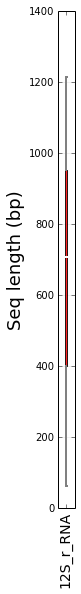

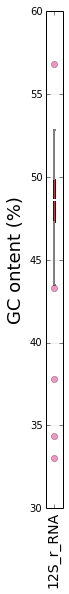

In [34]:
%matplotlib inline
pj.report_seq_stats()

In [35]:
# Define minima and maxima

gc_inliers = {
    '12S_r_RNA': [40,55]
}
len_inliers = {
    '12S_r_RNA': [50,1300]
}


# Apply to loci data
for locus in gc_inliers:
    # trim GC outliers
    pj.filter_by_gc_content(locus,
                            min_percent_gc=gc_inliers[locus][0],
                            max_percent_gc=gc_inliers[locus][1])

    # trim length outlier
    pj.filter_by_seq_length(locus,
                            min_length=len_inliers[locus][0],
                            max_length=len_inliers[locus][1])

Confirm the length filter has worked.

Distribution Of Sequence Lengths
Distribution Of Sequence Statistic "Gc_Content"


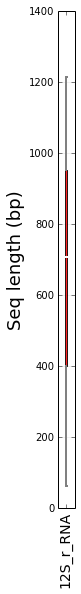

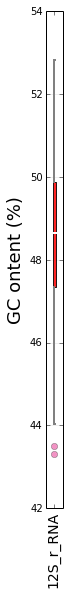

In [36]:
%matplotlib inline
pj.report_seq_stats()

Pickle the project.

In [37]:
pickle_pj(pj, 'Project/fish_nr.pkl')

'Project/fish_nr.pkl'

# Alignment

Now, need to produce a sequence alignment file based on an alignment of all 12S sequences. This will be done with the AlnConf class.

In [38]:
pj = unpickle_pj('Project/fish_nr.pkl', git=False)

MAFFT linsi configuration:

In [39]:
mafft_linsi = AlnConf(pj,                              # The Project
                      method_name='mafftLinsi',        # Any unique method name,
                      CDSAlign=False,                  # Use this method to align
                      #codontable=5,                   # The genetic code that
                      program_name='mafft',            # mafft or muscle.
                      cmd='mafft',                     # The command on your machine
                      loci=['12S_r_RNA'],                    # A list of loci names to align.vel.
                      cline_args={'localpair': True,   # Program specific keywords and arguments.
                                  'maxiterate': 1000}  # cine_args=={} by default, which will
                     )

mafft --localpair --maxiterate 1000 647911494347713.34_12S_r_RNA.fasta


Once there are one or more AlnConf objects, they can be executed in one go using the Project method align. This method accepts a list of AlnConf objects and does whatever it is each of them tells it:

In [40]:
pj.align([mafft_linsi])

When the process is done, the AlnConf objects will be stored in pj.used_methods, which is a dictionary using the method names as keys. If you print one of these AlnConf objects as a string, you will get complete details about the process, including programme versions and references:

In [41]:
pj.used_methods

{'mafftLinsi': <reprophylo.AlnConf instance at 0x7f0b35c79440>}

In [42]:
print pj.used_methods['mafftLinsi']

AlnConf named mafftLinsi with ID 647911494347713.34
Loci: 12S_r_RNA 
Created on: Tue May  9 16:35:13 2017
Commands:
12S_r_RNA: mafft --localpair --maxiterate 1000 647911494347713.34_12S_r_RNA.fasta

Environment:
Platform: Linux-4.4.0-75-generic-x86_64-with-Ubuntu-14.04-trusty
 Processor: x86_64
 Python build: defaultMar 22 2014 22:59:56
 Python compiler: GCC 4.8.2
 Python implementation: CPython
 Python version: 2.7.6
 ete2 version: 2.2.1072
 biopython version: 1.68
 dendropy version: 3.12.2
 cloud version: 2.8.5
 reprophylo version 1.3
 User: biopc3
 Program and version: MAFFT v7.123b
 Program reference:Katoh
 Standley 2013 (Molecular Biology and Evolution 30:772-780) MAFFT multiple sequence alignment software version 7: improvements in performance and usability.
execution time:
330.918542862


Core Methods section sentence:
The dataset(s) 12S_r_RNA were aligned using the program MAFFT v7.123b [1].

Reference:
Katoh, Standley 2013 (Molecular Biology and Evolution 30:772-780) MAFFT mul

The alignment itself is stored in the pj.alignments dictionary, using keys that follow this pattern: locus_name@method_name where method_name is the name you have provided to your AlnConf object.

In [43]:
pj.alignments

{'12S_r_RNA@mafftLinsi': <<class 'Bio.Align.MultipleSeqAlignment'> instance (362 records of length 1428, IUPACProtein()) at 7f0b3565e8d0>}

Alignment text files can be dumped in any AlignIO format for usage in an external command line or GUI program. When writing to files, you can control the header of the sequence by, for example, adding the organism name of the gene name, or by replacing the feature ID with the record ID.

In [44]:
pj.write_alns(id=['record_id','source_organism'], format='fasta')

['12S_r_RNA@mafftLinsi_aln.fasta']

Pickle the project.

In [45]:
pickle_pj(pj, 'Project/fish_nr.pkl')

'Project/fish_nr.pkl'

# Alignment trimming

Call the keys of the pj.alignments dictionary to see the names of the alignments it contains:

In [46]:
pj.alignments.keys()

['12S_r_RNA@mafftLinsi']

__Using gappyout alignment routine is fine for building the tree, but if you intend to use the alignment somehow as reference to map reads to then you need to be careful here because 'gappyout' may slice out regions from the alignemnt that are problematic so you may miss certain parts that would be necessary to align reads to it.__

The alignment needs to be trimmed to remove large gaps in sequences. The cell below contains the reprophylo solution for clipping the alignment - the default gappyout algorithm. With TrimalConf, instead of specifying loci names, we provide alignment names, as they appear in the keys of pj.alignments.

In [47]:
gappyout = TrimalConf(pj,                           # The Project
                      method_name='gappyout',       # Any unique string ('gappyout' is default)
                      program_name='trimal',        # No alternatives in this ReproPhylo version
                      cmd='default',                # default = trimal. Change here or in pj.defaults['trimal']
                      alns=['12S_r_RNA@mafftLinsi'],  # 'all' by default
                      trimal_commands={'gappyout': True} # By default, the gappyout algorithm is used.
                     )

trimal -in 387441494348046.74_12S_r_RNA@mafftLinsi.fasta -gappyout


In [48]:
pj.trim([gappyout])

Alignment 12S_r_RNA@mafftLinsi@gappyout has undetermined sequences (1 bp or less) which will be dropped: ['DQ455047.1_f0', 'FJ188382.1_f0', 'FJ817301.1_f0', 'HM229294.1_f0', 'HM229295.1_f0', 'HM229293.1_f0', 'HM229311.1_f0', 'FJ817319.1_f0']


In [49]:
print pj.used_methods['gappyout']

TrimalConf named gappyout with ID 387441494348046.74
Alignments: 12S_r_RNA@mafftLinsi 
Created on: Tue May  9 16:40:46 2017
Commands:
12S_r_RNA@mafftLinsi@gappyout: trimal -in 387441494348046.74_12S_r_RNA@mafftLinsi.fasta -gappyout

Environment:Platform: Linux-4.4.0-75-generic-x86_64-with-Ubuntu-14.04-trusty
 Processor: x86_64
 Python build: defaultMar 22 2014 22:59:56
 Python compiler: GCC 4.8.2
 Python implementation: CPython
 Python version: 2.7.6
 ete2 version: 2.2.1072
 biopython version: 1.68
 dendropy version: 3.12.2
 cloud version: 2.8.5
 reprophylo version 1.3
 User: biopc3
 Program and version: trimAl 1.2rev59
 Program reference: Salvador Capella-Gutierrez; Jose M. Silla-Martinez; Toni Gabaldon. trimAl: a tool for automated alignment trimming in large-scale phylogenetic analyses. Bioinformatics 2009 25: 1972-1973.
execution time:
2.37968420982

Core Methods section sentence:
The alignment(s) 12S_r_RNA@mafftLinsi were trimmed using the program trimAl 1.2rev59 [1].

Reference:


The trimmed alignments themselves are stored in the pj.trimmed_alignments dictionary, using keys.

In [50]:
pj.trimmed_alignments

{'12S_r_RNA@mafftLinsi@gappyout': <<class 'Bio.Align.MultipleSeqAlignment'> instance (354 records of length 691, IUPACAmbiguousDNA()) at 7f0b341c3b50>}

Trimmed alignment text files can be dumped in any AlignIO format for usage in an external command line or GUI program. When writing to files, you can control the header of the sequence by, for example, adding the organism name of the gene name, or by replacing the feature ID with the record ID.

In [51]:
pj.write_trimmed_alns(id=['record_id','source_organism'], format='fasta')

['12S_r_RNA@mafftLinsi@gappyout_trimmed_aln.fasta']

Trimmed alignments can be viewed in the same way as alignments, but using this command:

In [52]:
pj.show_aln('12S_r_RNA@mafftLinsi@gappyout',id=['record_id','source_organism'])

Pickle the project.

In [53]:
pickle_pj(pj, 'Project/fish_nr.pkl')

'Project/fish_nr.pkl'

Write trimmed alignment to file for downstream taxonomic curation using SATIVA.

In [54]:
#fetch the trimmed alignment object from Reprophylo
ali = pj.fta('12S_r_RNA@mafftLinsi@gappyout')

#iterate over all records in the alignment, modify the id, i.e. remove the '_f0' bit.
for r in ali:
    r.id = "_".join(r.id.split("_")[:-1])
    print r.id
    
print ali

out=open('trimmed_fish_12S_align.phy', 'w')
AlignIO.write(ali, out, 'phylip-relaxed')
out.close()

returning trimmed alignment object 12S_r_RNA@mafftLinsi@gappyout
KC292935.1
AJ001798.1
KF856964.1
KJ627918.1
DQ447667.1
HM177473.1
AJ001795.1
KC292931.1
EU851898.1
DQ288268.1
Y12671.1
KC292927.1
LC146110.1
KU821707.1
HQ641696.1
KM273799.1
JQ661390.1
AB239593.1
AM778105.1
EU643689.1
Y12663.1
KJ564240.1
KC292939.1
Y12665.1
AF038468.1
KJ627936.1
KC292923.1
AY283320.1
AF542204.1
KT278765.1
KJ671449.1
AB125244.1
JX188254.1
Y12667.1
EU552656.1
KU755530.1
JX899750.1
AY430252.1
JN007558.1
AF488492.1
KJ564239.1
KM273828.1
KC292943.1
KF384093.1
AF126364.1
KM052222.1
JQ661382.1
JQ231114.1
KC441960.1
AF126357.1
AP011214.1
JQ390056.1
KU681006.1
AF126355.1
KP013097.1
KJ627926.1
KJ627920.1
KJ564250.1
AY283316.1
KP452507.1
KF384091.1
AP009304.1
AY897013.1
HM162839.1
AP011279.1
KT989571.1
KF147851.1
LC146128.1
KM659025.1
AF042480.1
AP011236.1
KM282394.1
DQ536425.1
HQ875340.1
KJ627923.1
KJ627924.1
AP017364.1
AJ319819.1
LC012541.1
AY283318.1
KJ564254.1
JQ911695.1
KJ564230.1
KF856965.1
AF154850.1
AB016701

SATIVA requires a taxonomic file that has been generated from a genbank file containing all record IDs included in the trimmed alignment.

__This is a complicated way of doing it:__ First, the alignment must be parsed in fasta format and record IDs altered to contain only the ID as entered on genbank e.g. EU116957.1

__The better way is to directly use the 'fetch trimmed alignment' reprophylo function:__

Next, the record IDs must be extracted from the trimmed alignment file.

In [55]:
to_keep = []

print pj.trimmed_alignments

#fetch the trimmed alignment object from Reprophylo
ali = pj.fta('12S_r_RNA@mafftLinsi@gappyout')

#iterate over all records in the alignment, modify the id and write to list
for r in ali:
    record_id = "_".join(r.id.split("_")[:-1])
    print record_id
    to_keep.append(record_id)

{'12S_r_RNA@mafftLinsi@gappyout': <<class 'Bio.Align.MultipleSeqAlignment'> instance (354 records of length 691, IUPACAmbiguousDNA()) at 7f0b341c3b50>}
returning trimmed alignment object 12S_r_RNA@mafftLinsi@gappyout
KC292935.1
AJ001798.1
KF856964.1
KJ627918.1
DQ447667.1
HM177473.1
AJ001795.1
KC292931.1
EU851898.1
DQ288268.1
Y12671.1
KC292927.1
LC146110.1
KU821707.1
HQ641696.1
KM273799.1
JQ661390.1
AB239593.1
AM778105.1
EU643689.1
Y12663.1
KJ564240.1
KC292939.1
Y12665.1
AF038468.1
KJ627936.1
KC292923.1
AY283320.1
AF542204.1
KT278765.1
KJ671449.1
AB125244.1
JX188254.1
Y12667.1
EU552656.1
KU755530.1
JX899750.1
AY430252.1
JN007558.1
AF488492.1
KJ564239.1
KM273828.1
KC292943.1
KF384093.1
AF126364.1
KM052222.1
JQ661382.1
JQ231114.1
KC441960.1
AF126357.1
AP011214.1
JQ390056.1
KU681006.1
AF126355.1
KP013097.1
KJ627926.1
KJ627920.1
KJ564250.1
AY283316.1
KP452507.1
KF384091.1
AP009304.1
AY897013.1
HM162839.1
AP011279.1
KT989571.1
KF147851.1
LC146128.1
KM659025.1
AF042480.1
AP011236.1
KM282394.1

You must create an empty list in which the record IDs in pj.records that match the record IDs from the trimmed alignment can be stored and then written out in a reduced genbank file.

In [56]:
out_gb = []

for r in pj.records:
    if r.id in to_keep:
        out_gb.append(r)

for r in out_gb:
    print r.id
    
out = open("12S_preSATIVA_fish.gb", "w")
SeqIO.write(out_gb, out, "genbank")
out.close()

KC292935.1
AJ001798.1
KF856964.1
KJ627918.1
DQ447667.1
HM177473.1
AJ001795.1
KC292931.1
EU851898.1
DQ288268.1
Y12671.1
KC292927.1
LC146110.1
KU821707.1
HQ641696.1
KM273799.1
JQ661390.1
AB239593.1
AM778105.1
EU643689.1
Y12663.1
KJ564240.1
KC292939.1
Y12665.1
AF038468.1
KJ627936.1
KC292923.1
AY283320.1
AF542204.1
KT278765.1
KJ671449.1
AB125244.1
JX188254.1
Y12667.1
EU552656.1
KU755530.1
JX899750.1
AY430252.1
JN007558.1
AF488492.1
KJ564239.1
KM273828.1
KC292943.1
KF384093.1
AF126364.1
KM052222.1
JQ661382.1
JQ231114.1
KC441960.1
AF126357.1
AP011214.1
JQ390056.1
KU681006.1
AF126355.1
KP013097.1
KJ627926.1
KJ627920.1
KJ564250.1
AY283316.1
KP452507.1
KF384091.1
AP009304.1
AY897013.1
HM162839.1
AP011279.1
KT989571.1
KF147851.1
LC146128.1
KM659025.1
AF042480.1
AP011236.1
KM282394.1
DQ536425.1
HQ875340.1
KJ627923.1
KJ627924.1
AP017364.1
AJ319819.1
LC012541.1
AY283318.1
KJ564254.1
JQ911695.1
KJ564230.1
KF856965.1
AF154850.1
AB016701.1
KJ746964.1
KJ564228.1
AY050550.1
AJ002629.1
FJ710984.1
KJ47699

How to run SATIVA is described in a different notebook. It may be a good strategy to set this going now in a separate notebook. Then continue onwards in this notebook. See "2-SATIVA", run the three notebooks in order:
installSATIVA.ipynb   >>  createSATIVAtaxfile.ipynb  >> runSATIVA.ipynb

# Build tree

Infer Maximum Likelihood tree based on the clipped alignment. We are going to use RAxML. 

Configure RAxML for trimmed muscle alignment.

In [57]:
raxml = RaxmlConf(pj, 
                  method_name='raxml-mafftLinsi-trimmed',
                  program_name='raxmlHPC-PTHREADS-SSE3',
                  keepfiles=True,
                  cmd='raxmlHPC-PTHREADS-SSE3',
                  preset='fa',
                  alns=['12S_r_RNA@mafftLinsi@gappyout'],
                  model='GAMMA',
                  threads=5,
                  cline_args={'-#': 100})

raxmlHPC-PTHREADS-SSE3 -f a -m GTRGAMMA -n 627211494348052.26_12S_r_RNA@mafftLinsi@gappyout0 -p 624 -s 627211494348052.26_12S_r_RNA@mafftLinsi@gappyout.fasta -T 5 -x 641 -N 100


In [58]:
pj.tree([raxml])

In [59]:
print pj.used_methods['raxml-mafftLinsi-trimmed']

RaxmlConf named raxml-mafftLinsi-trimmed with ID 627211494348052.26
Alignments: 12S_r_RNA@mafftLinsi@gappyout 
Created on: Tue May  9 16:40:52 2017
Commands:
12S_r_RNA@mafftLinsi@gappyout:
raxmlHPC-PTHREADS-SSE3 -f a -m GTRGAMMA -n 627211494348052.26_12S_r_RNA@mafftLinsi@gappyout0 -p 624 -s 627211494348052.26_12S_r_RNA@mafftLinsi@gappyout.fasta -T 5 -x 641 -N 100

Environment:
Platform: Linux-4.4.0-75-generic-x86_64-with-Ubuntu-14.04-trusty
 Processor: x86_64
 Python build: defaultMar 22 2014 22:59:56
 Python compiler: GCC 4.8.2
 Python implementation: CPython
 Python version: 2.7.6
 ete2 version: 2.2.1072
 biopython version: 1.68
 dendropy version: 3.12.2
 cloud version: 2.8.5
 reprophylo version 1.3
 User: biopc3
 Program and version: raxmlHPC-PTHREADS-SSE3RAxML version 8.0.12
 Program reference: A. Stamatakis: RAxML Version 8: A tool for Phylogenetic Analysis and Post-Analysis of Large Phylogenies. In Bioinformatics
 2014.
execution time:
2360.26844192

Core Methods section sentence

In [60]:
pickle_pj(pj, 'Project/fish_nr.pkl')

'Project/fish_nr.pkl'

# Visualise Tree

Now let's visualize the tree.

Prepare tree annotation:
- define outgroups
- specify support coloration

In [61]:
pj.add_qualifier_from_source('organism')

In [62]:
for r in pj.records:
    print r.format('genbank')

LOCUS       JN105352               16581 bp    DNA     circular VRT 25-JUL-2016
DEFINITION  Cyprinus carpio carpio mitochondrion, complete genome.
ACCESSION   JN105352
VERSION     JN105352.1
KEYWORDS    .
SOURCE      mitochondrion Cyprinus carpio carpio (Russian scattered scale mirror
            carp)
  ORGANISM  Cyprinus carpio carpio
            Eukaryota; Metazoa; Chordata; Craniata; Vertebrata; Euteleostomi;
            Actinopterygii; Neopterygii; Teleostei; Ostariophysi; Cypriniformes;
            Cyprinidae; Cyprinus.
REFERENCE   1  (bases 1 to 16581)
  AUTHORS   Hu,G.F.
  TITLE     The complete mitochondrial genome of Russian scattered scaled mirror
            carp Cyprinus carpio L.
  JOURNAL   Unpublished
REFERENCE   2  (bases 1 to 16581)
  AUTHORS   Hu,G.F., Liang,H.W., Li,Z., Zhang,Z.W. and Zou,G.W.
  TITLE     Direct Submission
  JOURNAL   Submitted (17-MAY-2011) Yangtze River Fisheries Research Institute,
            The Chinese Academy of Fisheries Sciences, 41# Jiangh

In [63]:
for species in ['Lampetra']:
    pj.if_this_then_that(species, 'organism', 'outgroup', 'outgroup',
                         mode='part')

In [64]:
supports = {'black': [100,95],
            'dimgray': [95,75],
            'silver': [75,50]}

In [65]:
pj.clear_tree_annotations()

pj.annotate('.', 'outgroup','outgroup',
            ['source_organism', 'record_id'], 
            node_support_dict=supports, multifurc=10,
            scale=10, ##This will determine the width of the tree (default 1000)
            html='mafftLinsi-fish-trimmed-raxml.html')

Check trees out. Have a think which sequences you would consider mislabelled and should better be removed from the reference database.

Create a static copy of the tree (the last *.png with the expected alignment id) for later.

In [66]:
%%bash

last_png=$(ls -hlrt *12S_r_RNA@mafftLinsi@gappyout.png | tail -n 1 | perl -ne 'chomp; @a=split(" "); print "$a[-1]"')
cp $last_png 12S_mafftLinsi-fish-trimmed-raxml.png

**===========================================================================================**

In the meantime we have run SATIVA on the alignment that was the basis of the above tree.

Now we are going to highlight the records that SATIVA considers mislabelled in the tree. We are also going to add a heatmap to the tree illustrating the confidence that SATIVA has in a given call.

Parse SATIVA output and record putatively mislabelled sequence records and the confidence of the call.

In [67]:
rec_mislabelled = {}
sativa=open('../2-SATIVA/12S.mis', 'r')

for line in sativa:
    if not line.startswith(";"):
        rec_mislabelled[line.split("\t")[0]] = line.split("\t")[4]

Add two new qualifiers containing info about he SATIVA results to the sequence features.

In [68]:
for r in pj.records:
    if r.id in rec_mislabelled:
        for f in r.features:
            f.qualifiers['mislabeled'] = ['yes']
            f.qualifiers['mislabeled_conf'] = [rec_mislabelled[r.id]]
    else:
        for f in r.features:
            f.qualifiers['mislabeled'] = ['no']
            f.qualifiers['mislabeled_conf'] = [0.0001]

In [69]:
pj.propagate_metadata()

Prepare tree annotation:

- color records that were identified by SATIVA as being mislabelled.
- add heatmap with mislabel confidence

In [70]:
leaf_colors = {'yes':'red', 'no': 'black'}
bg_colors = {'yes':'red', 'no': 'white'}

In [71]:
pj.clear_tree_annotations()
pj.annotate('.', 'outgroup', 'outgroup', 
            ['source_organism', 'record_id'], 
            node_support_dict=supports, multifurc=10,
            html='12S_muscleDefault-trimmed-fish-raxml-SATIVA.html',
            fsize=13,
            scale=10,  ##This will determine the width of the tree (default 1000)
            heat_map_meta = ['mislabeled_conf'], heat_map_colour_scheme = 1,
            leaf_node_color_meta = 'mislabeled', leaf_label_colors = leaf_colors)

In [72]:
%%bash

last_png=$(ls -hlrt *12S_r_RNA@mafftLinsi@gappyout.png | tail -n 1 | perl -ne 'chomp; @a=split(" "); print "$a[-1]"')
cp $last_png 12S_mafftLinsi-fish-trimmed-raxml_SATIVA_leaf_colored.png

In [73]:
pj.clear_tree_annotations()
pj.annotate('.', 'outgroup', 'outgroup', 
            ['source_organism', 'record_id'], 
            node_support_dict=supports, multifurc=10,
            html='12S_muscleDefault-trimmed-fish-raxml-SATIVA.html',
            fsize=13,
            scale=10, ##This will determine the width of the tree (default 1000)
            heat_map_meta = ['mislabeled_conf'], heat_map_colour_scheme = 1,
            node_bg_meta = 'mislabeled', node_bg_color = bg_colors)

In [74]:
%%bash

target=12S_mafftLinsi-fish-trimmed-raxml_SATIVA_bg_colored.png

last_png=$(ls -hlrt *12S_r_RNA@mafftLinsi@gappyout.png | tail -n 1 | perl -ne 'chomp; @a=split(" "); print "$a[-1]"')
cp $last_png $target

In [75]:
pickle_pj(pj, 'Project/fish_nr.pkl')

'Project/fish_nr.pkl'